In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('P39-Financial-Data.csv')
data.head()

,entry_id,age,pay_schedule,home_owner,income,months_employed,years_employed,current_address_year,personal_account_m,personal_account_y,...,amount_requested,risk_score,risk_score_2,risk_score_3,risk_score_4,risk_score_5,ext_quality_score,ext_quality_score_2,inquiries_last_month,e_signed
0,7629673,40,bi-weekly,1,3135,0,3,3,6,2,...,550,36200,0.737398,0.903517,0.487712,0.515977,0.580918,0.380918,10,1
1,3560428,61,weekly,0,3180,0,6,3,2,7,...,600,30150,0.738510,0.881027,0.713423,0.826402,0.730720,0.630720,9,0
2,6934997,23,weekly,0,1540,6,0,0,7,1,...,450,34550,0.642993,0.766554,0.595018,0.762284,0.531712,0.531712,7,0
3,5682812,40,bi-weekly,0,5230,0,6,1,2,7,...,700,42150,0.665224,0.960832,0.767828,0.778831,0.792552,0.592552,8,1
4,5335819,33,semi-monthly,0,3590,0,5,2,2,8,...,1100,53850,0.617361,0.857560,0.613487,0.665523,0.744634,0.744634,12,0


In [3]:
data.describe()

,entry_id,age,home_owner,income,months_employed,years_employed,current_address_year,personal_account_m,personal_account_y,has_debt,amount_requested,risk_score,risk_score_2,risk_score_3,risk_score_4,risk_score_5,ext_quality_score,ext_quality_score_2,inquiries_last_month,e_signed
count,1.790800e+04,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000,17908.000000
mean,5.596978e+06,43.015412,0.425173,3657.214653,1.186006,3.526860,3.584711,3.427183,3.503350,0.795399,950.446449,61086.302211,0.690878,0.878276,0.583155,0.718252,0.623112,0.622068,6.457226,0.538251
std,2.562473e+06,11.873107,0.494383,1504.890063,2.400897,2.259732,2.751937,2.216440,1.955568,0.403421,698.543683,15394.255020,0.090470,0.054563,0.125061,0.120697,0.139729,0.139898,3.673093,0.498549
min,1.111398e+06,18.000000,0.000000,905.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,350.000000,2100.000000,0.023258,0.451371,0.016724,0.153367,0.010184,0.006622,1.000000,0.000000
25%,3.378999e+06,34.000000,0.000000,2580.000000,0.000000,2.000000,2.000000,2.000000,2.000000,1.000000,600.000000,49350.000000,0.640993,0.850882,0.500208,0.633708,0.521735,0.519677,4.000000,0.000000
50%,5.608376e+06,42.000000,0.000000,3260.000000,0.000000,3.000000,3.000000,2.000000,3.000000,1.000000,700.000000,61200.000000,0.699561,0.881004,0.588208,0.725113,0.625944,0.622974,6.000000,1.000000
75%,7.805624e+06,51.000000,1.000000,4670.000000,1.000000,5.000000,5.000000,5.000000,4.000000,1.000000,1100.000000,72750.000000,0.752887,0.912608,0.672395,0.806681,0.729841,0.728940,8.000000,1.000000
max,9.999874e+06,96.000000,1.000000,9985.000000,11.000000,16.000000,12.000000,11.000000,15.000000,1.000000,10200.000000,99750.000000,0.999997,0.999024,0.978932,0.996260,0.970249,0.966953,30.000000,1.000000


In [4]:
data.isna().sum()

entry_id                0
age                     0
pay_schedule            0
home_owner              0
income                  0
months_employed         0
years_employed          0
current_address_year    0
personal_account_m      0
personal_account_y      0
has_debt                0
amount_requested        0
risk_score              0
risk_score_2            0
risk_score_3            0
risk_score_4            0
risk_score_5            0
ext_quality_score       0
ext_quality_score_2     0
inquiries_last_month    0
e_signed                0
dtype: int64

In [5]:
import pandas_profiling as pp
profile = pp.ProfileReport(data)
profile.to_file("profiling.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
profile

Correlation plot with response variable

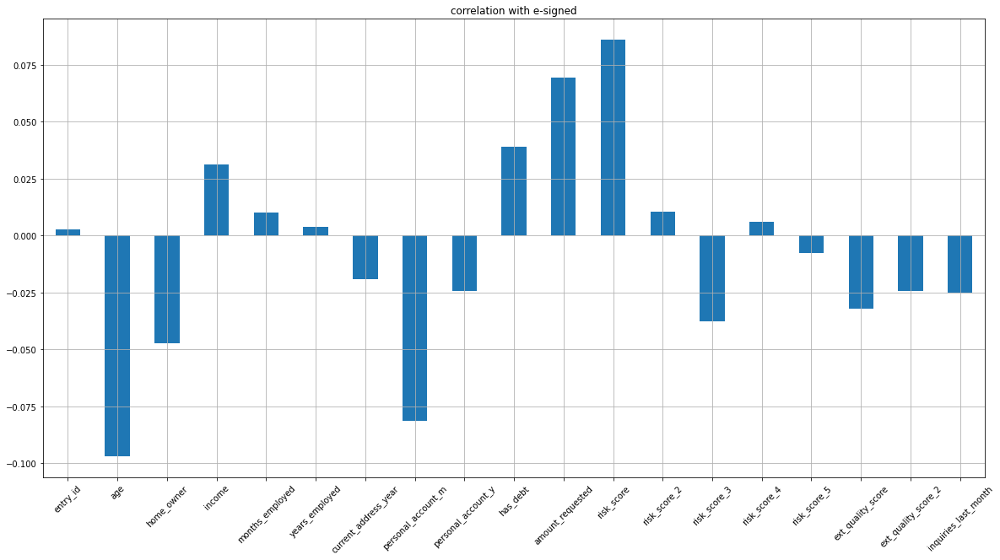

In [8]:
data.drop(columns = 'e_signed').corrwith(data.e_signed).plot.bar(figsize=(20,10), title = "correlation with e-signed", rot = 45,grid = True)

FEATURE ENGINEERING

In [9]:
data.drop(columns = 'months_employed', inplace = True)

In [10]:
data['personal_account_mth'] = data['personal_account_m'] + (data['personal_account_y']*12)

In [12]:
data.drop(columns = ['personal_account_m', 'personal_account_y'], inplace = True)

In [13]:
#OHE
data = pd.get_dummies(data)
data.columns

Index(['entry_id', 'age', 'home_owner', 'income', 'years_employed',
       'current_address_year', 'has_debt', 'amount_requested', 'risk_score',
       'risk_score_2', 'risk_score_3', 'risk_score_4', 'risk_score_5',
       'ext_quality_score', 'ext_quality_score_2', 'inquiries_last_month',
       'e_signed', 'personal_account_mth', 'pay_schedule_bi-weekly',
       'pay_schedule_monthly', 'pay_schedule_semi-monthly',
       'pay_schedule_weekly'],
      dtype='object')

In [14]:
data.drop(columns = ['pay_schedule_semi-monthly'], inplace = True)

In [16]:
y = data[['e_signed']]
data.drop(columns = ['e_signed', 'entry_id'], inplace = True)

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X_train, X_test, y_train, y_test = train_test_split(data,y, test_size = 0.2, stratify = y)
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

MODEL

# Linear regression (Lasso)

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score,precision_score, recall_score
clf = LogisticRegression(penalty='l1',  solver = 'liblinear')
clf.fit(X_train_sc,y_train)
y_pred = clf.predict(X_test_sc)
acc = accuracy_score(y_test,y_pred)
prec = precision_score(y_test,y_pred)
rec = recall_score(y_test,y_pred)
f1 = f1_score(y_test,y_pred)

results = pd.DataFrame([['linear regression lasso', acc, prec, rec, f1]], columns = ['model', 'accuracy', 'precision', 'recall', 'f1_score'])

/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


# Support Vector Machine

In [30]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score,precision_score, recall_score
clf = SVC(kernel = 'rbf', C = 0.01)
clf.fit(X_train_sc,y_train)
y_pred = clf.predict(X_test_sc)
acc = accuracy_score(y_test,y_pred)
prec = precision_score(y_test,y_pred)
rec = recall_score(y_test,y_pred)
f1 = f1_score(y_test,y_pred)

model_results3 = pd.DataFrame([['SVM linear_rbf', acc, prec, rec, f1]], columns = ['model', 'accuracy', 'precision', 'recall', 'f1_score'])
results = results.append(model_results3)


/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [31]:
results

,model,accuracy,precision,recall,f1_score
0,linear regression lasso,0.582915,0.588283,0.750000,0.659371
0,SVM linear,0.591290,0.591555,0.777490,0.671896
0,SVM linear_2,0.591569,0.591141,0.782158,0.673365
0,SVM linear_2,0.538247,0.538247,1.000000,0.699819
0,SVM linear_rbf,0.538247,0.538247,1.000000,0.699819


# Random Forest

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score,precision_score, recall_score
clf = RandomForestClassifier(n_estimators= 200, criterion= 'entropy')
clf.fit(X_train_sc,y_train)
y_pred = clf.predict(X_test_sc)
acc = accuracy_score(y_test,y_pred)
prec = precision_score(y_test,y_pred)
rec = recall_score(y_test,y_pred)
f1 = f1_score(y_test,y_pred)

model_results3 = pd.DataFrame([['Random Forest', acc, prec, rec, f1]], columns = ['model', 'accuracy', 'precision', 'recall', 'f1_score'])
results = results.append(model_results3)

/tmp/ipykernel_5122/768414213.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train_sc,y_train)


In [35]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = clf,X = X_train_sc, y = y_train, cv = 10)
print("Random forrest classifier's accuracy is: %0.2f" % accuracies.mean())

/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/model_selection/_validation

Random forrest classifier's accuracy is: 0.63


In [36]:
results

,model,accuracy,precision,recall,f1_score
0,linear regression lasso,0.582915,0.588283,0.750000,0.659371
0,SVM linear,0.591290,0.591555,0.777490,0.671896
0,SVM linear_2,0.591569,0.591141,0.782158,0.673365
0,SVM linear_2,0.538247,0.538247,1.000000,0.699819
0,SVM linear_rbf,0.538247,0.538247,1.000000,0.699819
0,Random Forest,0.648800,0.664538,0.701763,0.682644
